# Quanto Costa?: Predicting Fair Rental Prices Across Italy

## Overview

Ever wondered if that charming apartment in Milan is worth €1,200 a month? Or why a similar flat in Naples costs half as much? This project dives into the colorful world of Italian rental homes to answer these questions.

We're building a friendly guide that helps you understand what you're really paying for when renting across Italy's diverse cities and regions.

### What You'll Discover:
- What makes a rental command top euro in different Italian cities?
- How much that extra bathroom or balcony is actually worth?
- Why location matters (and exactly how much it matters!)?
- Which luxury features justify a premium price?
- How the same apartment might be priced differently across Rome, Florence, or Milan?
- Can we help you predict a fair price for your dream Italian apartment?

### Who This Helps:
- Renters wondering if they're getting a fair deal
- Property owners trying to set the right price
- Newcomers to Italy navigating an unfamiliar market
- Investors looking for the best rental returns
- Anyone curious about Italy's housing landscape

### The Dataset: A Window Into Italian Homes

This collection represents real homes where people live their daily lives - from cozy studios in Bologna where university students prepare for exams, to elegant apartments in Rome's historic center where professionals host dinner parties on their terraces. Each listing captures a slice of Italian life and the price tag that comes with it.

#### What We Know About Each Home (Dataset):

**The Essentials:**
- Monthly rent (from modest €300 studios to luxurious €5,000+ apartments)
- Living space (typically between 30m² and 200m²)
- Number of bedrooms and bathrooms
- Floor level and building height
- Parking availability (a place to park your Vespa or Fiat)

**The Comforts of Home:**
- Furnished or unfurnished
- Elevator access (whether you can avoid the stairs after grocery shopping)
- Balcony or terrace space (Space for your morning espresso outside)
- Garden access
- Air conditioning and heating systems
- And more!

**Location Details:**
- Regions from Alpine Trentino-Alto Adige to Mediterranean Sicily
- Cities from fashion-forward Milan to historic Naples.
- Neighborhood information that tell you whether you're in the tourist center or a local's paradise.


By turning complex housing data into clear insights, we're making the Italian rental journey more transparent and less stressful for everyone involved.

Benvenuti a casa!

In [2]:
# Data preprocessing
import pandas as pd
import numpy as np

# geopandas
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

# predictive modeling
from scipy import stats
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
import xgboost as xgb
import lightgbm as lgb
import joblib
from sklearn.inspection import permutation_importance
import shap

# plotting
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import warnings
#set style 
plt.style.use('seaborn-v0_8')
sns.set_theme(style = 'whitegrid')
pd.set_option('display.max_columns', None)

# Filter the specific warning
warnings.filterwarnings('ignore', category=FutureWarning)


 ## 1. Data Exploration and Statistics

In [ ]:
df = pd.read_csv('data/cleaned_rent_data.csv')
df.head(20)

,date_posted,year,month,season,city,neighborhood,region,price,price_per_m2,area,bathrooms,floor,total_floors,parking_spaces,num_bedrooms,num_living_rooms,total_rooms,energy_value,energy_class,room_to_bathroom_ratio,floor_to_height_ratio,bedroom_ratio,has_elevator,has_furnished,has_balcony,has_tv_system,has_external_exposure,has_fiber_optic,has_electric_gate,has_cellar,has_shared_garden,has_private_garden,has_doorman,has_pool,is_villa,is_apartment,is_penthouse,is_loft,is_mansard
0,2023-03-07,2023,3,2,Milano,Centrale,lombardia,1800.0,30.000000,60.0,1.0,9.0,10.0,1,2.0,1.0,3.0,132.32,E,3.000000,0.900000,0.666667,1,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0
1,2023-03-07,2023,3,2,Torino,Santa Rita,piemonte,450.0,8.181818,55.0,1.0,5.0,5.0,0,1.0,1.0,2.0,175.00,E,2.000000,1.000000,0.500000,1,1,1,1,1,0,0,1,0,0,0,0,0,1,0,0,0
2,2023-03-07,2023,3,2,Padova,Prato della Valle - Pontecorvo,veneto,3200.0,8.000000,400.0,3.0,2.0,3.0,4,5.0,3.0,8.0,127.60,E,2.666667,0.666667,0.625000,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
3,2022-12-21,2022,12,1,Firenze,Galluzzo,toscana,1700.0,8.500000,200.0,3.0,1.0,1.0,0,4.0,4.0,8.0,211.23,G,2.666667,1.000000,0.500000,0,0,1,1,1,1,1,0,0,1,0,0,1,0,0,0,0
4,2023-03-06,2023,3,2,Monte Argentario,Località Poggio Pertuso,toscana,4000.0,25.000000,160.0,3.0,0.0,2.0,2,4.0,1.0,5.0,175.00,G,1.666667,0.000000,0.800000,0,1,1,1,1,0,1,0,0,1,0,0,1,0,0,0,0
5,2023-02-12,2023,2,1,Bagno a Ripoli,via di villamagna 75,toscana,650.0,16.250000,40.0,1.0,0.0,1.0,0,1.0,1.0,2.0,175.00,G,2.000000,0.000000,0.500000,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
6,2023-03-07,2023,3,2,Firenze,Michelangelo - Poggio Imperiale,toscana,900.0,16.363636,55.0,1.0,1.0,1.0,0,1.0,2.0,3.0,175.00,G,3.000000,1.000000,0.333333,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0
7,2023-03-07,2023,3,2,Firenze,Le Cure,toscana,1325.0,8.833333,150.0,2.0,2.0,3.0,2,4.0,1.0,5.0,51.00,E,2.500000,0.666667,0.800000,1,1,1,1,0,1,1,1,0,0,0,0,0,1,0,0,0
8,2023-03-07,2023,3,2,Trieste,Cologna - Università,friuli-venezia-giulia,600.0,9.677419,62.0,1.0,0.0,1.0,0,1.0,1.0,2.0,175.00,Unknown,2.000000,0.000000,0.500000,1,1,0,1,1,0,0,0,0,1,1,0,0,1,0,0,0
9,2023-03-07,2023,3,2,Perugia,Ferro di Cavallo,umbria,600.0,8.571429,70.0,1.0,4.0,6.0,0,2.0,1.0,3.0,175.00,C,3.000000,0.666667,0.666667,1,1,0,1,1,1,0,0,0,0,0,0,0,1,0,0,0


In [4]:
# Basic info
print(f'Number of records: {len(df)}')
print(f'Number of features: {df.shape[1]}')
print(f'Feature types:')
print(df.dtypes.value_counts())

Number of records: 119093
Number of features: 39
Feature types:
int64      21
float64    13
object      5
Name: count, dtype: int64


In [5]:
# Detailed summary statistics
print(f'Numeric features:')
df.describe(include = [np.number]).T.style.format("{:.2f}")

Numeric features:


,count,mean,std,min,25%,50%,75%,max
year,119093.00,2022.96,0.29,2010.00,2023.00,2023.00,2023.00,2023.00
month,119093.00,5.39,1.59,1.00,5.00,6.00,6.00,12.00
season,119093.00,2.46,0.60,1.00,2.00,2.00,3.00,4.00
price,119093.00,1843.35,41396.80,1.00,538.00,800.00,1350.00,12500000.00
price_per_m2,119093.00,104.20,5648.65,0.00,7.86,11.82,20.00,1300000.00
area,119093.00,79.46,50.26,1.00,50.00,70.00,95.00,500.00
bathrooms,119093.00,1.32,0.61,1.00,1.00,1.00,2.00,19.00
floor,119093.00,1.76,1.66,0.00,1.00,1.00,3.00,42.00
total_floors,119093.00,3.88,7.97,1.00,2.00,4.00,5.00,1976.00
parking_spaces,119093.00,0.53,0.94,0.00,0.00,0.00,1.00,20.00


### Key Observations from Numeric Features
Looking at the descriptive statistics, there are several issues that need attention:

1. Price-Related Issues
- Unrealistic Minimum: `price` of 1€ is too low
- Extreme Maximum: 12.5M€ for rent seems unrealistic
- High Standard Deviation: Indicates potential outliers
- `price_per_m2`: Values of 0 and 1.3M€/m² are suspicious
2. Property Features Issues
- `area`: Minimum of 1m² is unrealistic
- `total_floors`: Maximum of 1976 floors is impossible
- `energy_value`: Extremely high values and variance

Let's create a function to clean these issues:

In [ ]:
def clean_outliers(df):
    
    df_clean = df.copy()
    
    # Define realistic bounds
    bounds = {
        'price': (200, 10000),  # Reasonable monthly rent range.
        'price_per_m2': (3, 100),  # Reasonable price per m2
        'area': (15, 1000),  # Reasonable house size
        'bathrooms': (1, 10),
        'floor': (0, 50),  # Maximum reasonable floor, Allianz Tower in Millan has 50 floors, which is the maximum in Italy. 
        'total_floors': (1, 50),
        'parking_spaces': (0, 10),
        'num_bedrooms': (0, 10),
        'num_living_rooms': (0, 10),
        'total_rooms': (1, 20),
        'energy_value': (1, 1000)  # Reasonable energy values
    }
    
    # Track removed records
    initial_size = len(df_clean)
    
    # Apply bounds and track changes
    print("Cleaning Summary:")
    print("-" * 50)
    
    for column, (min_val, max_val) in bounds.items():
        invalid_count = df_clean[
            (df_clean[column] < min_val) | 
            (df_clean[column] > max_val)
        ].shape[0]
        
        if invalid_count > 0:
            print(f"{column}:")
            print(f"  Records outside [{min_val}, {max_val}]: {invalid_count:,}")
            print(f"  Before cleaning: {len(df_clean):,}")
            
            df_clean = df_clean[
                (df_clean[column] >= min_val) & 
                (df_clean[column] <= max_val)
            ]
            
            print(f"  After cleaning: {len(df_clean):,}")
            print()
    
    # Report total impact
    records_removed = initial_size - len(df_clean)
    print("\nFinal Summary:")
    print(f"Initial records: {initial_size:,}")
    print(f"Records removed: {records_removed:,} ({records_removed/initial_size*100:.1f}%)")
    print(f"Records remaining: {len(df_clean):,}")
    
    return df_clean

# Apply cleaning
df_cleaned = clean_outliers(df)

Cleaning Summary:
--------------------------------------------------
price:
  Records outside [200, 10000]: 1,774
  Before cleaning: 119,093
  After cleaning: 117,319

price_per_m2:
  Records outside [3, 100]: 2,842
  Before cleaning: 117,319
  After cleaning: 114,477

area:
  Records outside [15, 1000]: 115
  Before cleaning: 114,477
  After cleaning: 114,362

bathrooms:
  Records outside [1, 10]: 3
  Before cleaning: 114,362
  After cleaning: 114,359

total_floors:
  Records outside [1, 50]: 80
  Before cleaning: 114,359
  After cleaning: 114,279

parking_spaces:
  Records outside [0, 10]: 7
  Before cleaning: 114,279
  After cleaning: 114,272

total_rooms:
  Records outside [1, 20]: 5,871
  Before cleaning: 114,272
  After cleaning: 108,401

energy_value:
  Records outside [1, 1000]: 1,268
  Before cleaning: 108,401
  After cleaning: 107,133


Final Summary:
Initial records: 119,093
Records removed: 11,960 (10.0%)
Records remaining: 107,133


In [ ]:
def plot_feature_comparison(df_original, df_cleaned, feature):
    """
    Plot box plots and violin plots for comparison of original and cleaned data.
    """
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    # Prepare data for plotting
    plot_data = pd.DataFrame({
        'Original': df_original[feature],
        'Cleaned': df_cleaned[feature]
    })
    
    # Box plot comparison
    sns.boxplot(data=plot_data, ax=axes[0])
    axes[0].set_title(f'{feature} box plot comparison')
    axes[0].set_yscale('log')
    
    # Violin plot comparison
    sns.violinplot(data=plot_data, ax=axes[1])
    axes[1].set_title(f'{feature} violin plot comparison')
    axes[1].set_yscale('log')
    
    plt.tight_layout()
    plt.show()

def plot_histogram(df_original, df_cleaned, feature, bins=100):
    """
    Plot histograms with density curves for both original and cleaned data.
    """
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plot original data histogram
    sns.histplot(data=df_original, x=feature, bins=bins, 
                stat='density', ax=axes[0])
    sns.kdeplot(data=df_original[feature], color='red', 
                label='Density', ax=axes[0])
    axes[0].set_title(f'{feature} Distribution (Original Data)')
    axes[0].set_xlabel(feature)
    axes[0].set_ylabel('Density')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    # Plot cleaned data histogram
    sns.histplot(data=df_cleaned, x=feature, bins=bins, 
                stat='density', ax=axes[1])
    sns.kdeplot(data=df_cleaned[feature], color='red', 
                label='Density', ax=axes[1])
    axes[1].set_title(f'{feature} Distribution (Cleaned Data)')
    axes[1].set_xlabel(feature)
    axes[1].set_ylabel('Density')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()  


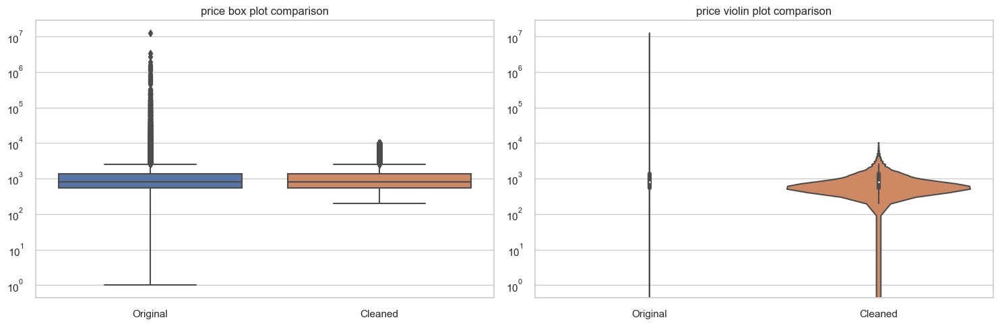

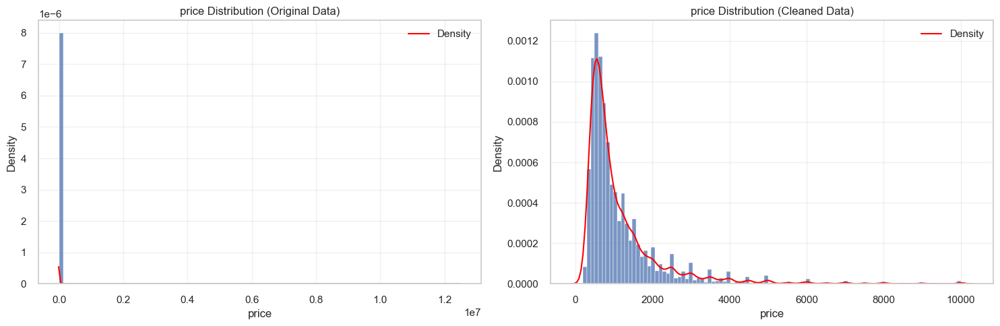

In [8]:
# Compare distributions in price
plot_feature_comparison(df, df_cleaned, 'price')
plot_histogram(df, df_cleaned, 'price')

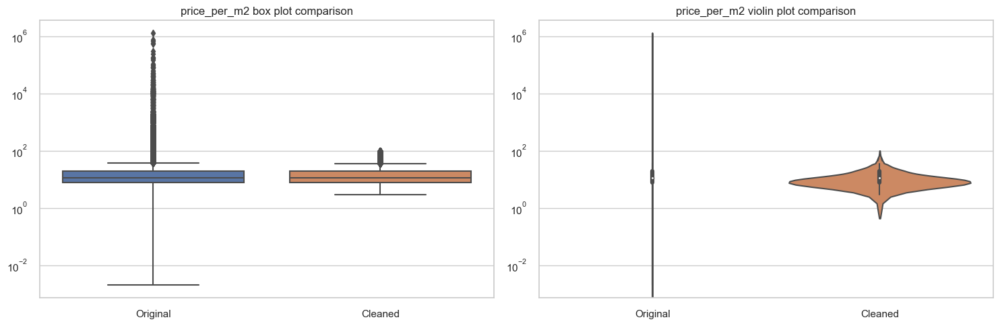

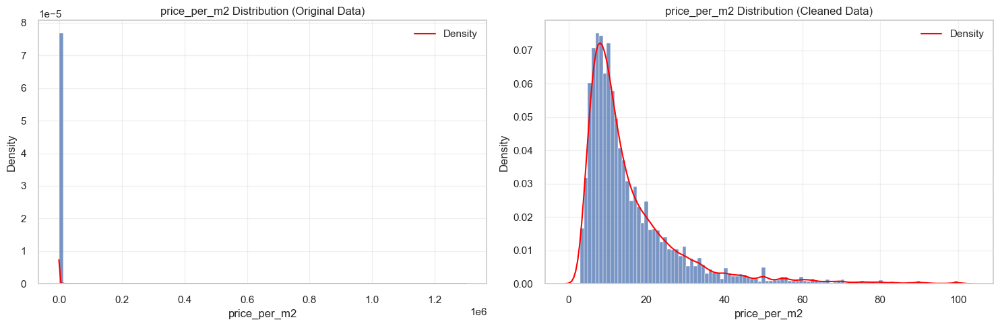

In [9]:
# Compare distributions and histogram in price_per_m2
plot_feature_comparison(df, df_cleaned, 'price_per_m2')
plot_histogram(df, df_cleaned, 'price_per_m2')

### Price & Price/m² Distributions

The cleaned `price` distribution reveals a heavily right-skewed pattern with a dominant peak around 500-1000€, rapidly declining into a long tail. Most properties cluster below 2000€, with premium listings appearing as sparse outliers extending to 10,000€. 

For price per square meter, data shows a similar right-skewed distribution peaking sharply at 10-15€/m². The majority of rental properties concentrate in this affordable range, with frequency dropping significantly after 20€/m² and extending in a thin tail to approximately 100€/m². Both metrics demonstrate the effectiveness of data cleaning in removing implausible values while preserving the natural market distribution patterns.

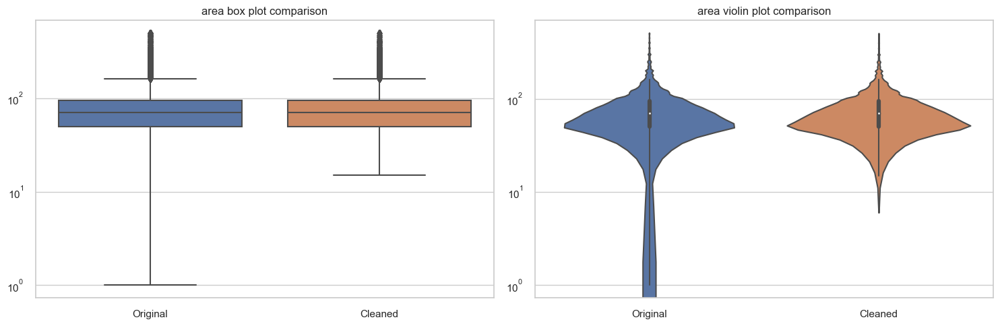

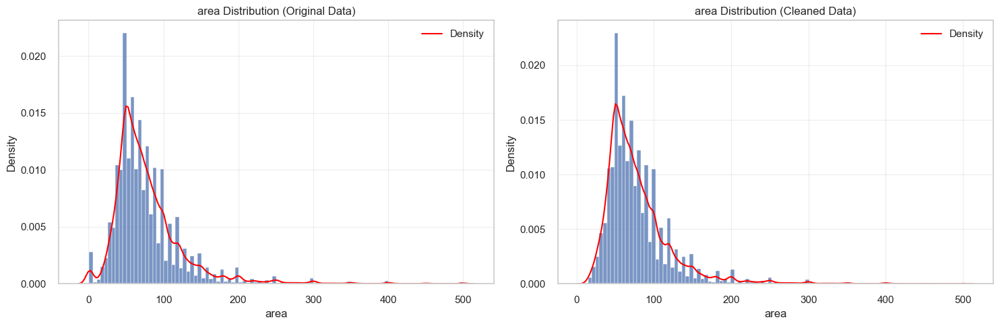

In [10]:
# Compare distributions and histogram in area
plot_feature_comparison(df, df_cleaned, 'area')
plot_histogram(df, df_cleaned, 'area')

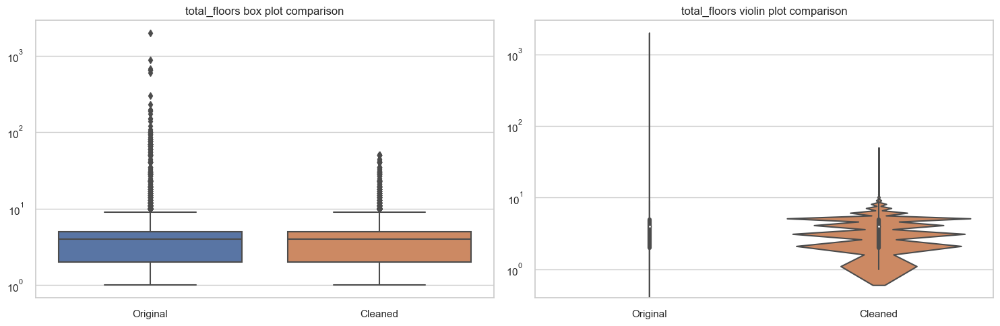

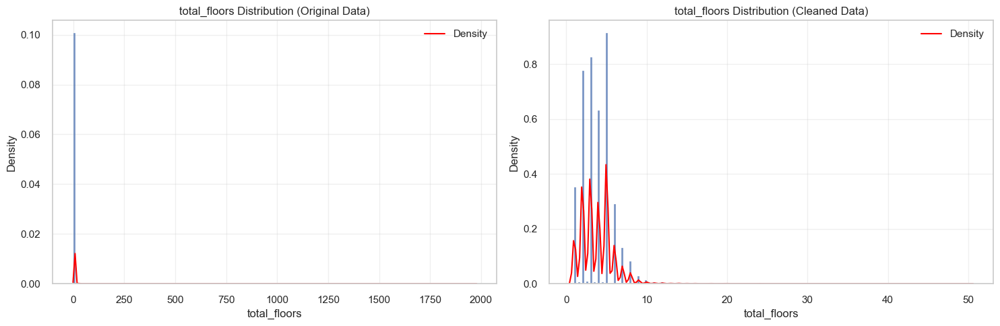

In [11]:
# Compare distributions and histogram in area
plot_feature_comparison(df, df_cleaned, 'total_floors')
plot_histogram(df, df_cleaned, 'total_floors', bins = 200)

### Area & Total floors Distributions
The data cleaning process effectively removed extreme outliers while preserving the overall distribution of key variables, ensuring improved data reliability. The `area` variable retained its general distribution but with fewer extreme values, making it more consistent. The `total_floors` variable, which initially contained significant inconsistencies, has been corrected, eliminating unrealistic values and resulting in a more accurate dataset. These refinements make the cleaned dataset more suitable for further analysis and modeling, minimizing the risk of skewed results due to anomalies.

 ## 2. Geographic Price Analysis

- Features like `is_loft` , `is_mansard` , `has_pool` , `is_penthouse` , `and is_villa` are very rare (below 5% threshold)
- On the other end, `is_apartment` is extremely common (nearly 90% of properties)
- Features like `has_tv_system` , `has_furnished` , and `has_balcony` are moderately common (50-80%)

In [12]:
# Load the geospatial data
regions_gdf = gpd.read_file('data/limits_IT_regions.geojson')
provinces_gdf = gpd.read_file('data/limits_IT_provinces.geojson')
municipalities_gdf = gpd.read_file('data/limits_IT_municipalities.geojson')

In [13]:
regions_gdf.head()

,reg_name,reg_istat_code_num,reg_istat_code,geometry
0,Piemonte,1,01,"POLYGON ((7.13605 45.27996, 7.13608 45.27952, ..."
1,Valle d'Aosta/Vallée d'Aoste,2,02,"POLYGON ((7.73455 45.92365, 7.73324 45.92345, ..."
2,Lombardia,3,03,"MULTIPOLYGON (((8.57964 45.75172, 8.58243 45.7..."
3,Trentino-Alto Adige/Südtirol,4,04,"POLYGON ((12.01396 46.55091, 12.02158 46.55966..."
4,Veneto,5,05,"POLYGON ((10.63538 45.53543, 10.63673 45.5209,..."


In [14]:
# First, let's check the region names in both datasets
print("\nRegion names in our rental data:")
print(sorted(df_cleaned['region'].unique()))
print("\nRegion names in the GeoJSON file:")
print(sorted(regions_gdf['reg_name'].unique()))


Region names in our rental data:
['Liguria', 'abruzzo', 'ancona', 'bari', 'basilicata', 'calabria', 'campania', 'catanzaro', 'emilia-Romagna', 'emilia-romagna', 'friuli-venezia-giulia', 'genova', 'l-aquila', 'lazio', 'liguria', 'lombardia', 'marche', 'milano', 'molise', 'napoli', 'palermo', 'piemonte', 'puglia', 'sardegna', 'sicilia', 'torino', 'toscana', 'trentino-alto-adige', 'trieste', 'umbria', 'valle-d-aosta', 'veneto', 'venezia']

Region names in the GeoJSON file:
['Abruzzo', 'Basilicata', 'Calabria', 'Campania', 'Emilia-Romagna', 'Friuli-Venezia Giulia', 'Lazio', 'Liguria', 'Lombardia', 'Marche', 'Molise', 'Piemonte', 'Puglia', 'Sardegna', 'Sicilia', 'Toscana', 'Trentino-Alto Adige/Südtirol', 'Umbria', "Valle d'Aosta/Vallée d'Aoste", 'Veneto']


There are some mistakes in the region names, some regions are named as cities such as Bari which is a city in Puglia. Needs some mapping before procedding.

In [ ]:
# Create a mapping dictionary to standardize region names
region_mapping = {
    'lombardia': 'Lombardia',
    'piemonte': 'Piemonte',
    'veneto': 'Veneto',
    'toscana': 'Toscana',
    'friuli-venezia-giulia': 'Friuli-Venezia Giulia',
    'umbria': 'Umbria',
    'emilia-romagna': 'Emilia-Romagna',
    'emilia-Romagna': 'Emilia-Romagna',  # Added capitalization variant
    'liguria': 'Liguria',
    'Liguria': 'Liguria',  # Added capitalized version
    'trentino-alto-adige': 'Trentino-Alto Adige/Südtirol',
    'calabria': 'Calabria',
    'lazio': 'Lazio',
    'puglia': 'Puglia',
    'campania': 'Campania',
    'sicilia': 'Sicilia',
    'marche': 'Marche',
    'abruzzo': 'Abruzzo',
    'molise': 'Molise',
    'basilicata': 'Basilicata',
    'sardegna': 'Sardegna',
    'valle-d-aosta': "Valle d'Aosta/Vallée d'Aoste",
    
    # Cities mapped to their regions
    'milano': 'Lombardia',
    'torino': 'Piemonte',
    'genova': 'Liguria',
    'napoli': 'Campania',
    'palermo': 'Sicilia',
    'bari': 'Puglia',
    'ancona': 'Marche',
    'catanzaro': 'Calabria',
    'l-aquila': 'Abruzzo',
    'trieste': 'Friuli-Venezia Giulia',
    'venezia': 'Veneto'
}

df_mapped = df_cleaned.copy()
df_mapped['region_standardized'] = df_mapped['region'].map(region_mapping)

# Check if any regions weren't mapped
unmapped = df_mapped[df_mapped['region_standardized'].isna()]['region'].unique()
if len(unmapped) > 0:
    print("\nUnmapped regions:", unmapped)
    
# Calculate regional statistics
region_prices_fixed = df_mapped.groupby('region_standardized')['price'].agg(['mean', 'median', 'count']).reset_index()
region_prices_fixed.columns = ['reg_name', 'mean_price', 'median_price', 'property_count']
region_prices_fixed = region_prices_fixed.sort_values('mean_price', ascending=False)

print("\nStandardized Region Statistics:")
display(region_prices_fixed)


Standardized Region Statistics:


,reg_name,mean_price,median_price,property_count
8,Lombardia,1649.114511,1300.0,21535
15,Toscana,1616.345089,1000.0,7004
13,Sardegna,1585.962025,900.0,790
6,Lazio,1301.949957,900.0,17505
18,Valle d'Aosta/Vallée d'Aoste,1297.085106,850.0,235
4,Emilia-Romagna,1133.302607,850.0,11814
19,Veneto,997.219290,750.0,7123
16,Trentino-Alto Adige/Südtirol,967.171560,850.0,1090
3,Campania,930.365085,650.0,6026
12,Puglia,910.288726,650.0,2182


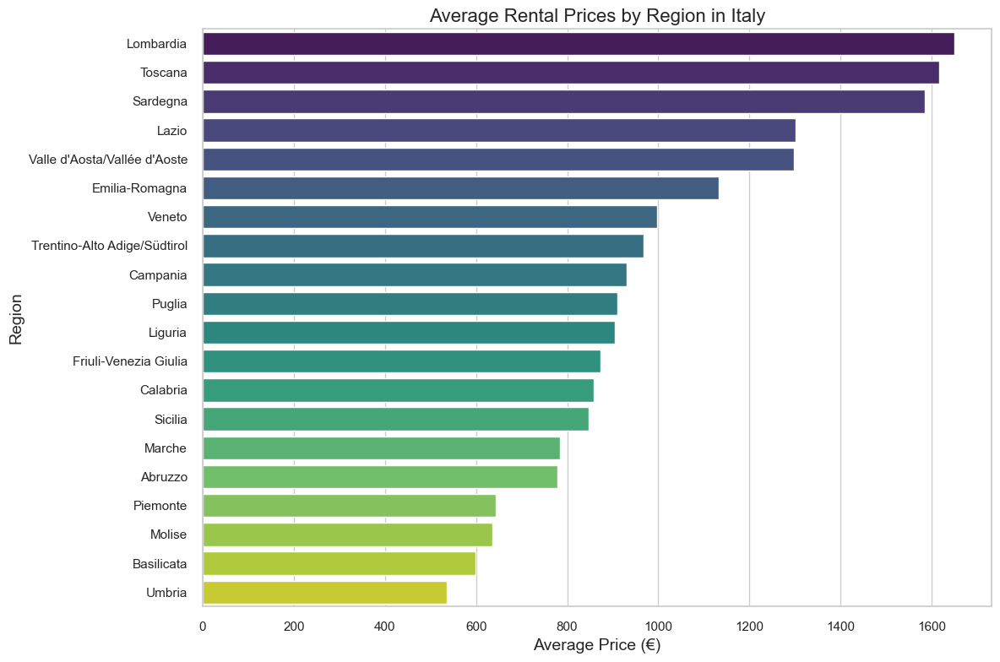

In [ ]:
# Bar plot of average prices by region
plt.figure(figsize=(12, 8))
sns.barplot(x='mean_price', y='reg_name', data=region_prices_fixed, palette='viridis')
plt.title('Average Rental Prices by Region in Italy', fontsize=16)
plt.xlabel('Average Price (€)', fontsize=14)
plt.ylabel('Region', fontsize=14)
plt.tight_layout()
plt.show()

The chart shows that there are essentially two rental markets in the country.

Northern powerhouse Lombardia tops the chart at over €1600, where Milan's bustling financial district drives prices skyward. The picturesque hills of Toscana follow closely behind, where renters pay a premium for those postcard-perfect views.

Surprisingly, island life in Sardegna comes with a hefty price tag too, challenging the notion that coastal living is more affordable.

The middle of the chart tells the story of Italy's economic backbone, regions like Emilia-Romagna and Lazio, where history and commerce blend together in cities like Bologna and Rome.

As we move down the chart, we see rental prices gradually decline through the central and southern regions, with places like Umbria and Basilicata offering more budget-friendly options for those willing to trade big-city convenience for authentic Italian charm.

In [17]:
# Merge with the GeoDataFrame
merged_gdf = regions_gdf.merge(region_prices_fixed, on='reg_name', how='left')

In [18]:
# Check the result
print("Number of regions with price data:", merged_gdf['mean_price'].notna().sum())

Number of regions with price data: 20


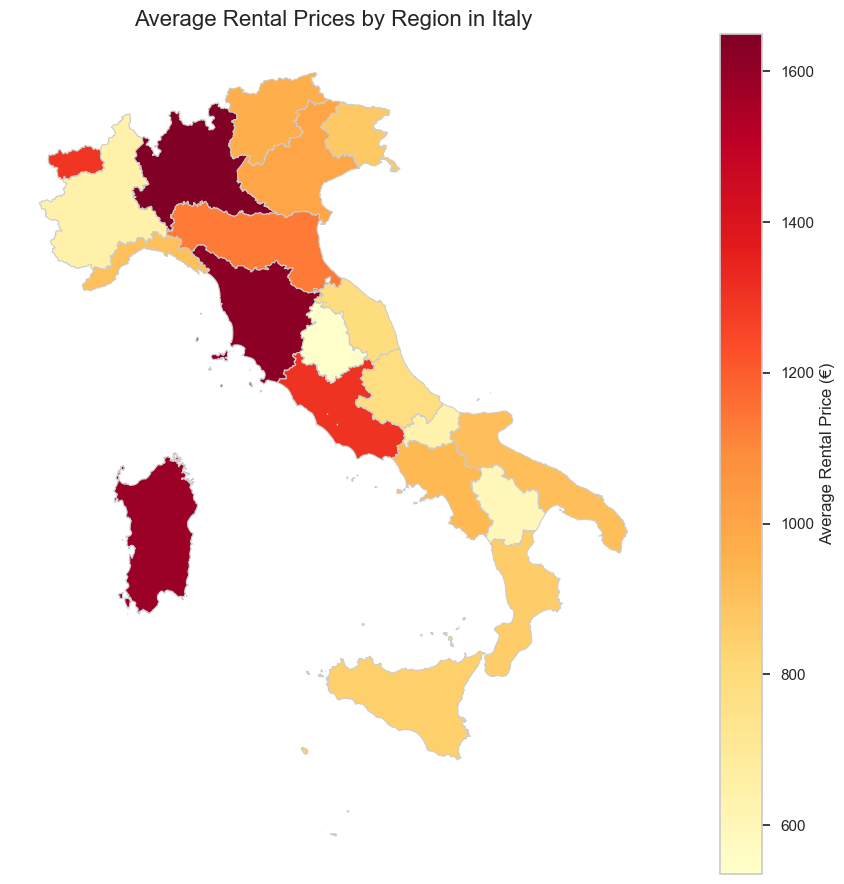

In [19]:
# Create a choropleth map
fig, ax = plt.subplots(1, 1, figsize=(13, 9))
merged_gdf.plot(column='mean_price', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8',
                legend=True, legend_kwds={'label': "Average Rental Price (€)"},
                missing_kwds={'color': 'lightgrey'})
ax.set_title('Average Rental Prices by Region in Italy', fontsize=16)
ax.set_axis_off()
plt.tight_layout()
plt.show()

### Italy's Rental Map: North vs South

The map shows a clear split in Italy's rental prices.

Northern Italy (Lombardia) has the highest rents (€1,649), with Milan being the most expensive city. Tuscany is also very expensive, as many tourists and foreigners want to live there.

Sardinia island is surprisingly costly, not what you'd expect for island living.

The middle of Italy shows medium prices, with Rome's region (Lazio) costing more than nearby areas.

Southern Italy is much cheaper, with places like Umbria offering the lowest rents at just €535.

This map tells an old story about Italy: rich north, middle-priced center, and more affordable south, a pattern that has existed for many years.

In [20]:
# Create an interactive Folium map
center = [41.8719, 12.5674]  # Center of Italy
m = folium.Map(location=center, zoom_start=6, tiles='CartoDB positron')

# Add choropleth layer
folium.Choropleth(
    geo_data=merged_gdf,
    name='choropleth',
    data=merged_gdf,
    columns=['reg_name', 'mean_price'],
    key_on='feature.properties.reg_name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Average Rental Price (€)'
).add_to(m)

# Add tooltips
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color': '#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color': '#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

tooltip = folium.features.GeoJson(
    merged_gdf,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['reg_name', 'mean_price', 'median_price', 'property_count'],
        aliases=['Region', 'Average Price (€)', 'Median Price (€)', 'Number of Properties'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
    )
)
m.add_child(tooltip)
folium.LayerControl().add_to(m)

# Display the map
m

Let's create an enhanced version of our map that includes province-level data:

In [21]:
# Calculate average prices by province using city data
# First, create a mapping from cities to provinces
city_to_province = {}
for idx, row in provinces_gdf.iterrows():
    province_name = row['prov_name']
    # For each major city, check if it's in the province name or vice versa
    for city in df_mapped['city'].unique():
        if city.lower() in province_name.lower() or province_name.lower() in city.lower():
            city_to_province[city] = province_name

# Add province information to our dataframe
df_mapped['province'] = df_mapped['city'].map(city_to_province)            

In [22]:
# Calculate province-level statistics
province_prices = df_mapped.groupby('province')['price'].agg(['mean', 'median', 'count']).reset_index()
province_prices.columns = ['prov_name', 'mean_price', 'median_price', 'property_count']
province_prices = province_prices.sort_values('mean_price', ascending=False)

In [23]:
# Merge with the provinces GeoDataFrame
merged_provinces = provinces_gdf.merge(province_prices, on='prov_name', how='left')


In [24]:
# Create an interactive Folium map with both regional and provincial data
center = [41.8719, 12.5674]  # Center of Italy
m = folium.Map(location=center, zoom_start=6, tiles='CartoDB positron')

# Add regional choropleth layer
region_choropleth = folium.Choropleth(
    geo_data=merged_gdf,
    name='Regional Prices',
    data=merged_gdf,
    columns=['reg_name', 'mean_price'],
    key_on='feature.properties.reg_name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Regional Average Rental Price (€)'
).add_to(m)

# Add province markers
marker_cluster = MarkerCluster(name='Major Cities').add_to(m)

# Add markers for provincial capitals
for idx, row in merged_provinces.iterrows():
    if pd.notna(row['mean_price']):  # Only add markers for provinces with data
        # Get centroid of the province geometry
        centroid = row['geometry'].centroid
        lat, lon = centroid.y, centroid.x
        
        # Create popup content
        popup_content = f"""
        <div style="width: 200px">
            <h4>{row['prov_name']}</h4>
            <b>Region:</b> {row['reg_name']}<br>
            <b>Average Rental Price:</b> €{row['mean_price']:.2f}<br>
            <b>Median Rental Price:</b> €{row['median_price']:.2f}<br>
            <b>Number of Properties:</b> {row['property_count']}
        </div>
        """
        
        # Add marker with popup
        folium.Marker(
            location=[lat, lon],
            popup=folium.Popup(popup_content, max_width=300),
            tooltip=row['prov_name'],
            icon=folium.Icon(color='blue', icon='info-sign')
        ).add_to(marker_cluster)

# Add tooltips for regions
tooltip = folium.features.GeoJson(
    merged_gdf,
    name='Region Details',
    style_function=lambda x: {'fillColor': '#ffffff', 'color': '#000000', 'fillOpacity': 0.1, 'weight': 0.1},
    control=True,
    highlight_function=lambda x: {'fillColor': '#000000', 'color': '#000000', 'fillOpacity': 0.50, 'weight': 0.1},
    tooltip=folium.features.GeoJsonTooltip(
        fields=['reg_name', 'mean_price', 'median_price', 'property_count'],
        aliases=['Region', 'Average Price (€)', 'Median Price (€)', 'Number of Properties'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
    )
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Display the map
m

In [25]:
# Let's analyze price per square meter by region
region_price_per_m2 = df_mapped.groupby('region_standardized')['price_per_m2'].agg(['mean', 'median', 'count']).reset_index()
region_price_per_m2.columns = ['reg_name', 'mean_price_per_m2', 'median_price_per_m2', 'property_count']
region_price_per_m2 = region_price_per_m2.sort_values('mean_price_per_m2', ascending=False)

In [26]:
# Display the price per square meter by region
print("Average Price per Square Meter by Region:")
display(region_price_per_m2)

Average Price per Square Meter by Region:


,reg_name,mean_price_per_m2,median_price_per_m2,property_count
8,Lombardia,25.097948,21.428571,21535
13,Sardegna,20.939901,13.000000,790
15,Toscana,19.880760,14.285714,7004
18,Valle d'Aosta/Vallée d'Aoste,18.348979,13.333333,235
6,Lazio,17.101708,14.166667,17505
4,Emilia-Romagna,16.299969,12.307692,11814
16,Trentino-Alto Adige/Südtirol,13.095348,11.666667,1090
19,Veneto,12.454225,10.166667,7123
7,Liguria,11.985057,8.928571,5459
9,Marche,11.244769,8.823529,2246


In [27]:
# Merge with the GeoDataFrame
merged_price_per_m2 = regions_gdf.merge(region_price_per_m2, on='reg_name', how='left')

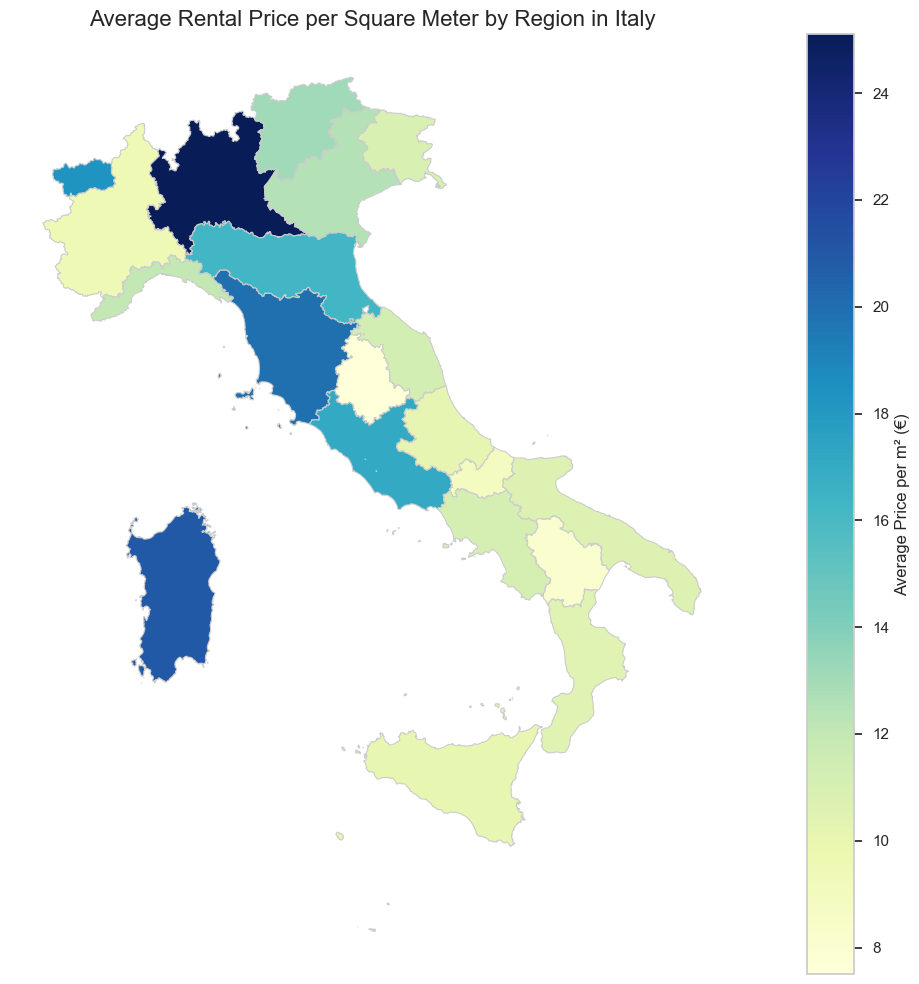

In [28]:
# Create a choropleth map for price per square meter
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
merged_price_per_m2.plot(column='mean_price_per_m2', cmap='YlGnBu', linewidth=0.8, ax=ax, edgecolor='0.8',
                         legend=True, legend_kwds={'label': "Average Price per m² (€)"},
                         missing_kwds={'color': 'lightgrey'})
ax.set_title('Average Rental Price per Square Meter by Region in Italy', fontsize=16)
ax.set_axis_off()
plt.tight_layout()
plt.show()

### Italy's Rental Price Per Square Meter

The map reveals where you get the least space for your money in Italy:

- **Lombardy** (darkest blue): Milan drives prices to €25/m², Italy's most expensive area
- **Sardinia**: Surprisingly costly at €22/m²
- **Tuscany & Lazio**: Mid-range at €18-20/m²
- **Southern regions**: Much better value at €8-10/m²

This price-per-square-meter view shows the true cost of living space, with northern urban areas charging premium rates for smaller apartments while southern Italy offers significantly more space for your euro.

## 3. Feature Importance and Correlation Analysis

In [29]:
# Select relevant numeric features for correlation analysis
numeric_features = [
    'price', 'price_per_m2', 'area', 'bathrooms', 'floor', 'total_floors', 
    'parking_spaces', 'num_bedrooms', 'num_living_rooms', 'total_rooms',
    'room_to_bathroom_ratio', 'floor_to_height_ratio', 'bedroom_ratio'
]

In [30]:
# Calculate correlation with price
price_correlation = df_cleaned[numeric_features].corr()['price'].sort_values(ascending=False)
print("\nFeature Correlation with Price:")
display(price_correlation)


Feature Correlation with Price:


price                     1.000000
price_per_m2              0.685939
area                      0.439294
bathrooms                 0.416939
num_bedrooms              0.337702
total_rooms               0.334260
num_living_rooms          0.204196
total_floors              0.089649
parking_spaces            0.048345
floor                     0.019509
bedroom_ratio             0.005088
room_to_bathroom_ratio   -0.030709
floor_to_height_ratio    -0.063111
Name: price, dtype: float64

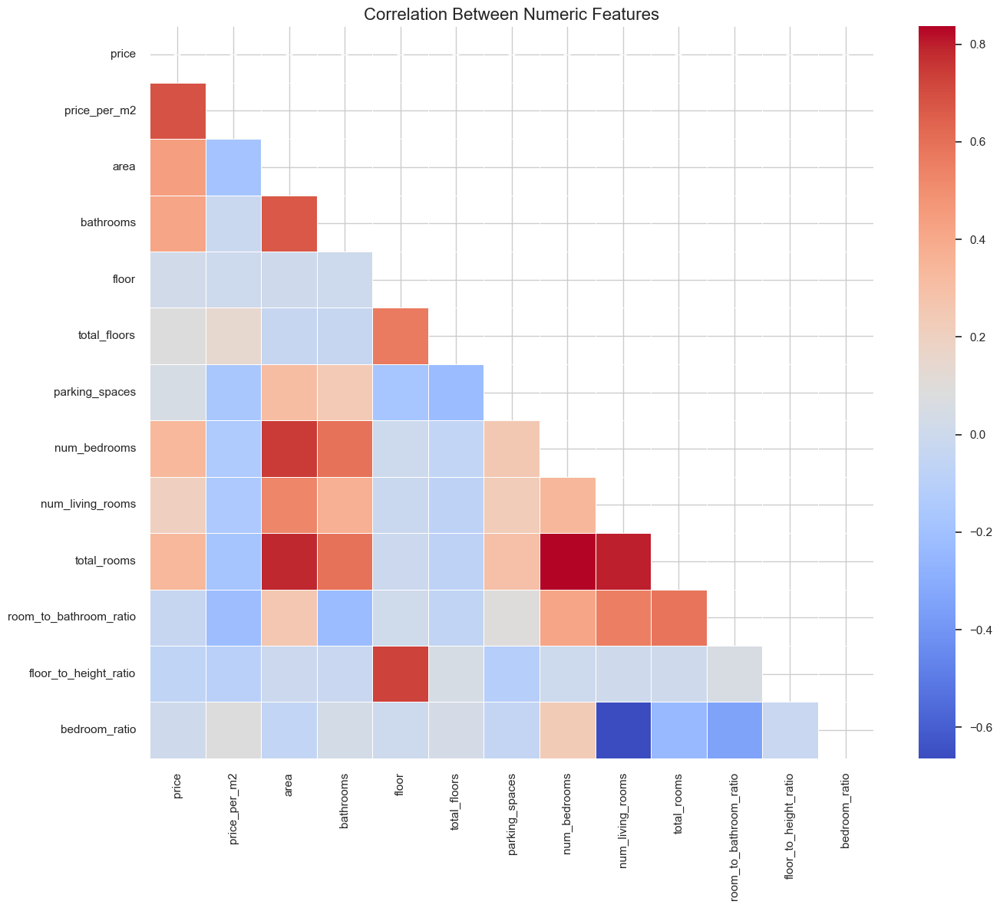

In [31]:
# correlation heatmap
plt.figure(figsize=(14, 12))
correlation_matrix = df_cleaned[numeric_features].corr()
mask = np.triu(correlation_matrix)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', 
            linewidths=0.5, mask=mask)
plt.title('Correlation Between Numeric Features', fontsize=16)
plt.tight_layout()
plt.show()

### Key Relationships in Rental Property Features

The correlation heatmap reveals several important patterns:

- **Strong positive correlations:**
  - Price and area (0.4): Larger properties cost more
  - Total rooms and bedrooms (0.8): More bedrooms mean more total rooms
  - Bathrooms and area (0.6): Larger properties have more bathrooms

- **Negative correlations:**
  - Price per m² and area (-0.2): Smaller properties cost more per square meter
  - Bedroom ratio and total rooms (-0.6): Properties with more rooms have a lower proportion of bedrooms

- **Weak correlations:**
  - Floor and price (near 0): Floor level has minimal impact on price
  - Parking spaces and price (0.2): Parking adds some value but isn't a major price driver

This suggests that total size, number of rooms, and bathrooms are the strongest physical predictors of rental prices in Italy.

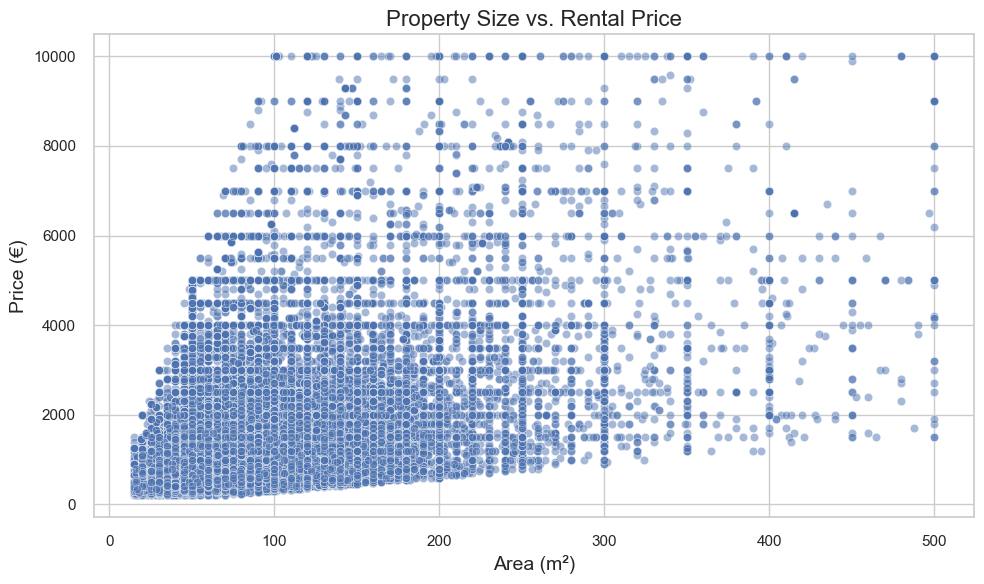

In [32]:
# Analyze how property size affects price
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_cleaned, x='area', y='price', alpha=0.5)
plt.title('Property Size vs. Rental Price', fontsize=16)
plt.xlabel('Area (m²)', fontsize=14)
plt.ylabel('Price (€)', fontsize=14)
plt.tight_layout()
plt.show()

### Property Size vs. Price: Key Insights

- **Clear upward trend**: Larger properties generally cost more, confirming the positive correlation we saw earlier
- **Dense concentration**: Most properties cluster between 50-200m² and €500-3,000
- **Price ceiling**: Notice the horizontal line at €10,000 - likely our data cleaning cutoff point
- **Spreading pattern**: The data points spread out as property size increases, showing greater price variation for larger properties
- **Outliers**: Some small properties (<100m²) command high prices (€5,000+), likely luxury apartments in premium locations

This visualization confirms that while size is a significant factor in determining rental prices, other factors (like location and amenities) create substantial variation, especially for larger properties.

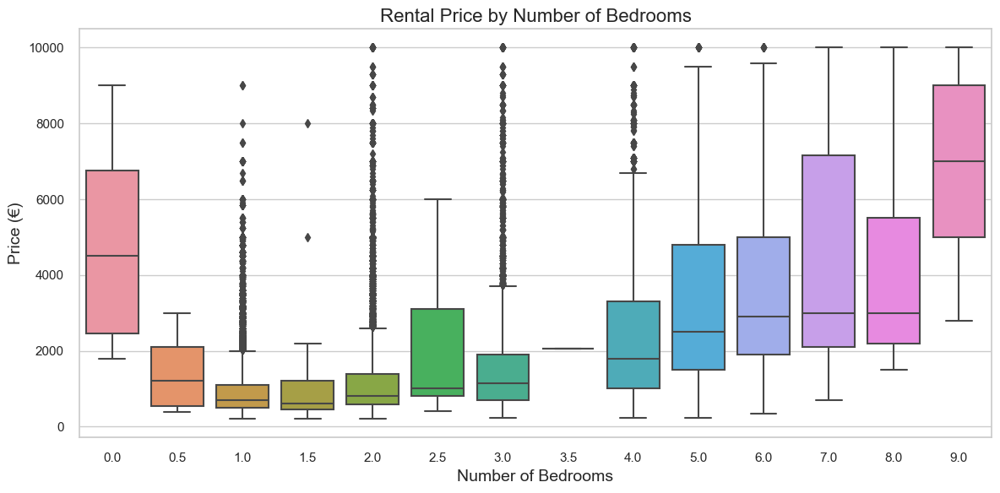

In [33]:
# Analyze how number of bedrooms affects price
plt.figure(figsize=(12, 6))
sns.boxplot(x='num_bedrooms', y='price', data=df_cleaned)
plt.title('Rental Price by Number of Bedrooms', fontsize=16)
plt.xlabel('Number of Bedrooms', fontsize=14)
plt.ylabel('Price (€)', fontsize=14)
plt.tight_layout()
plt.show()


### Bedroom Count & Rental Prices

- **Price progression**: Median prices generally increase with more bedrooms (1BR→9BR)
- **Unusual 0BR**: Studios (0BR) command higher prices than 1-3BR units, suggesting premium micro-apartments in desirable locations
- **Sweet spot**: 1-3 bedrooms show the most affordable median prices (€800-1,200)
- **Luxury segment**: Properties with 7+ bedrooms show significantly higher medians (€3,000+)
- **Price spread**: Greater variation in larger properties, with 9BR units ranging from €2,700-9,000

This confirms bedrooms strongly influence price, but with interesting exceptions for studios and significant price variation in the luxury segment

In [ ]:
# Analyze impact of amenities on price
amenity_features = [col for col in df_cleaned.columns if col.startswith('has_') or col.startswith('is_')]

In [35]:
# Calculate average price with and without each amenity
amenity_impact = []
for feature in amenity_features:
    with_amenity = df_cleaned[df_cleaned[feature] == 1]['price'].mean()
    without_amenity = df_cleaned[df_cleaned[feature] == 0]['price'].mean()
    price_diff = with_amenity - without_amenity
    percent_diff = (price_diff / without_amenity) * 100
    
    amenity_impact.append({
        'Amenity': feature.replace('has_', '').replace('is_', '').replace('_', ' ').title(),
        'With Amenity (€)': with_amenity,
        'Without Amenity (€)': without_amenity,
        'Price Difference (€)': price_diff,
        'Percentage Difference (%)': percent_diff
    })

amenity_df = pd.DataFrame(amenity_impact).sort_values('Percentage Difference (%)', ascending=False)
print("\nImpact of Amenities on Rental Price:")
display(amenity_df)


Impact of Amenities on Rental Price:


,Amenity,With Amenity (€),Without Amenity (€),Price Difference (€),Percentage Difference (%)
11,Pool,2333.446694,1136.314346,1197.132349,105.352216
12,Villa,2164.889035,1110.276072,1054.612964,94.986552
10,Doorman,1872.695125,969.289797,903.405328,93.202810
14,Penthouse,1865.566703,1142.838538,722.728165,63.239744
9,Private Garden,1521.140602,1109.830390,411.310213,37.060637
5,Fiber Optic,1309.515117,1049.932553,259.582564,24.723737
3,Tv System,1224.288993,1029.776711,194.512282,18.888782
4,External Exposure,1266.088353,1089.084089,177.004264,16.252580
1,Furnished,1183.378152,1038.744419,144.633733,13.923900
15,Loft,1137.821752,1155.129408,-17.307655,-1.498330


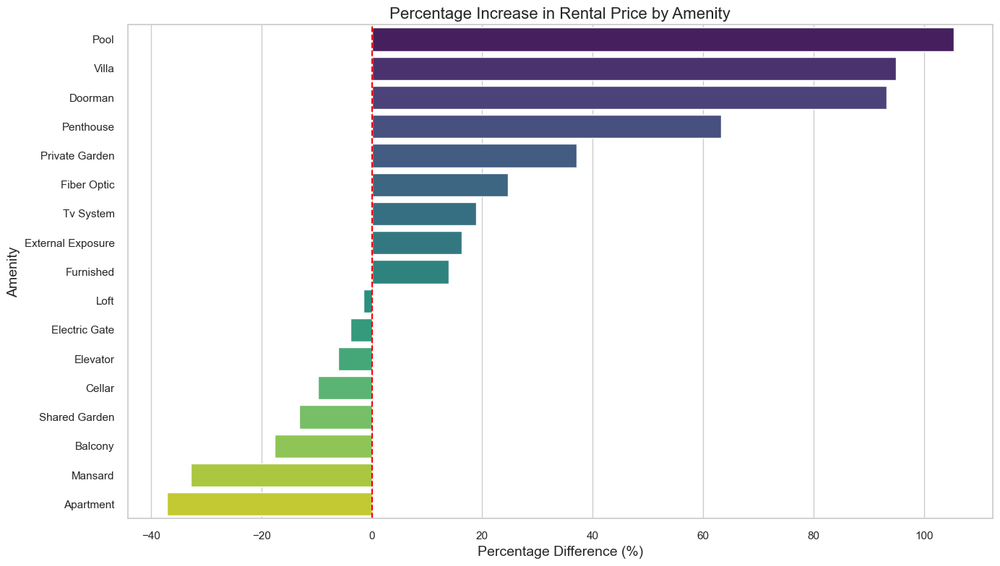

In [36]:
# Visualize the impact of amenities on price
plt.figure(figsize=(14, 8))
sns.barplot(x='Percentage Difference (%)', y='Amenity', data=amenity_df, palette='viridis')
plt.title('Percentage Increase in Rental Price by Amenity', fontsize=16)
plt.xlabel('Percentage Difference (%)', fontsize=14)
plt.ylabel('Amenity', fontsize=14)
plt.axvline(x=0, color='red', linestyle='--')
plt.tight_layout()
plt.show()


### Amenities' Impact on Italian Rental Prices

**Premium Features (60-100% increase)**
- Pool (+100%)
- Villa (+90%)
- Doorman (+85%)
- Penthouse (+60%)

**Significant Boosters (20-40% increase)**
- Private Garden (+40%)
- Fiber Optic (+25%)
- TV System (+20%)

**Modest Enhancers (5-20% increase)**
- External Exposure (+15%)
- Furnished (+12%)

**Discount Features (decrease prices)**
- Apartment (-30%)
- Mansard (-25%)
- Balcony (-10%) (I'm a bit surprised about this because I thought balconies would be a premium feature)
- Shared Garden (-8%)

This reveals luxury amenities command substantial premiums, while some common features (like balconies) are associated with lower-priced properties.

In [37]:
# Calculate feature importance using a Random Forest model
# Select features for the model
X_features = numeric_features + amenity_features
X_features.remove('price')  # Remove the target variable
X_features.remove('price_per_m2')  # Remove derivative of target to avoid collinearity

In [38]:
# Add region as a categorical feature
X = df_mapped[X_features + ['region_standardized']]
y = df_mapped['price']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

In [40]:
# Create preprocessor
numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, X_features),
        ('cat', categorical_transformer, ['region_standardized'])
    ])

In [41]:
# Create and train the model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
model = Pipeline(steps=[('preprocessor', preprocessor),
                         ('regressor', rf)])
model.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['area', 'bathrooms', 'floor',
                                                   'total_floors',
                                                   'parking_spaces',
                                                   'num_bedrooms',
                                                   'num_living_rooms',
                                                   'total_rooms',
                                                   'room_to_bathroom_ratio',
                                                   'floor_to_height_ratio',
                                                   'bedroom_ratio',
                                                   'has_elevator',
                                                   'has_furnished',
                                                   'has_balcony',
                                                   'has_tv_system',
                                                   'has_external_exposure',
                                                   'has_fiber_optic',
                                                   'has_electric_gate',
                                                   'has_cellar',
                                                   'has_shared_garden',
                                                   'has_private_garden',
                                                   'has_doorman', 'has_pool',
                                                   'is_villa', 'is_apartment',
                                                   'is_penthouse', 'is_loft',
                                                   'is_mansard']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['region_standardized'])])),
                ('regressor', RandomForestRegressor(random_state=42))])

In [42]:
# Get feature importance
feature_names = X_features + list(model.named_steps['preprocessor']
                                 .transformers_[1][1]
                                 .get_feature_names_out(['region_standardized']))
feature_importance = model.named_steps['regressor'].feature_importances_

In [43]:
# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
}).sort_values('Importance', ascending=False)

print("\nFeature Importance from Random Forest Model:")
display(importance_df.head(15))


Feature Importance from Random Forest Model:


,Feature,Importance
1,bathrooms,0.211930
0,area,0.151693
21,has_doorman,0.110873
3,total_floors,0.046273
9,floor_to_height_ratio,0.039640
4,parking_spaces,0.032909
11,has_elevator,0.032484
36,region_standardized_Lombardia,0.028005
10,bedroom_ratio,0.027436
43,region_standardized_Toscana,0.024017


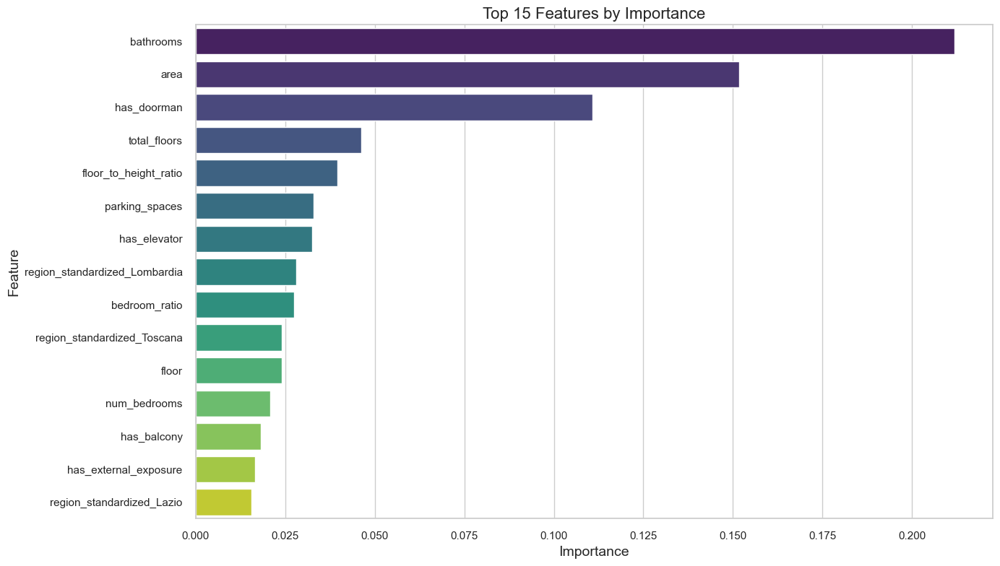

In [44]:
# Visualize feature importance
plt.figure(figsize=(14, 8))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(15), palette='viridis')
plt.title('Top 15 Features by Importance', fontsize=16)
plt.xlabel('Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.tight_layout()
plt.show()

### Most Important Features for Rental Pricing

The Random Forest feature importance chart reveals the key drivers of Italian rental prices:

**Primary Factors (>10% importance)**
- Bathrooms (20%): The strongest predictor by far
- Area (15%): Property size remains crucial
- Has doorman (10%): A premium service that significantly boosts value

**Secondary Factors (3-5% importance)**
- Total floors in building
- Floor-to-height ratio
- Parking spaces
- Elevator access

**Location Matters**
- Lombardia, Toscana, and Lazio appear in the top 15, confirming regional importance

**Structural Elements**
- Bedroom ratio and number of bedrooms have moderate importance
- Floor level has some impact on pricing

The random forest feature selction confirms bathrooms and size are the dominant factors, while doorman service emerges as surprisingly influential.

## 4. Times Series Analysis

In [45]:
 # Convert date_posted to datetime
df_cleaned['date_posted'] = pd.to_datetime(df_cleaned['date_posted'])

### 4.1 Seasonal Rental Price in Italy

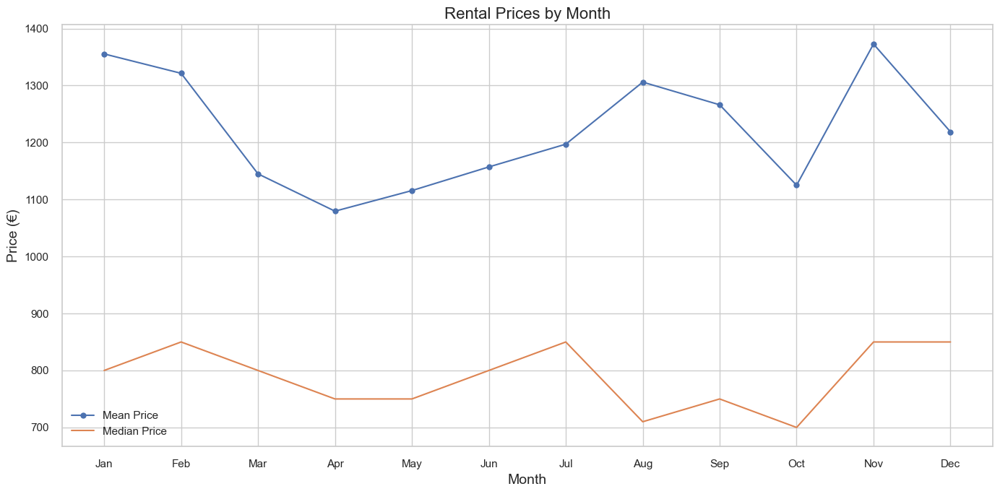

In [46]:
# Analyze seasonal patterns by month
monthly_pattern = df_cleaned.groupby('month')['price'].agg(['mean', 'median', 'count']).reset_index()
monthly_pattern.columns = ['month', 'mean_price', 'median_price', 'listing_count']

plt.figure(figsize=(14, 7))
plt.plot(monthly_pattern['month'], monthly_pattern['mean_price'], label='Mean Price', marker='o')
plt.plot(monthly_pattern['month'], monthly_pattern['median_price'], label='Median Price', marker='x')
plt.title('Rental Prices by Month', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Price (€)', fontsize=14)
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

**Peak Seasons (€1,300+)**
- **Winter start (Jan-Feb)**: High prices suggest demand for long-term rentals
- **Late summer (Aug)**: Tourist season drives prices up
- **November**: Surprising peak, possibly for winter holiday rentals

**Low Seasons (€1,100-1,150)**
- **April**: Lowest prices of the year
- **October**: Secondary dip before winter

**Price Spread**
- Mean prices (€1,100-1,380) consistently higher than medians (€700-850)
- Widest gap in November (~€550)
- Narrowest in April (~€350)

the seasonality suggests the rental market in Italy is influenced by both tourism cycles and academic/business calendars, with significant price premiums during peak periods.

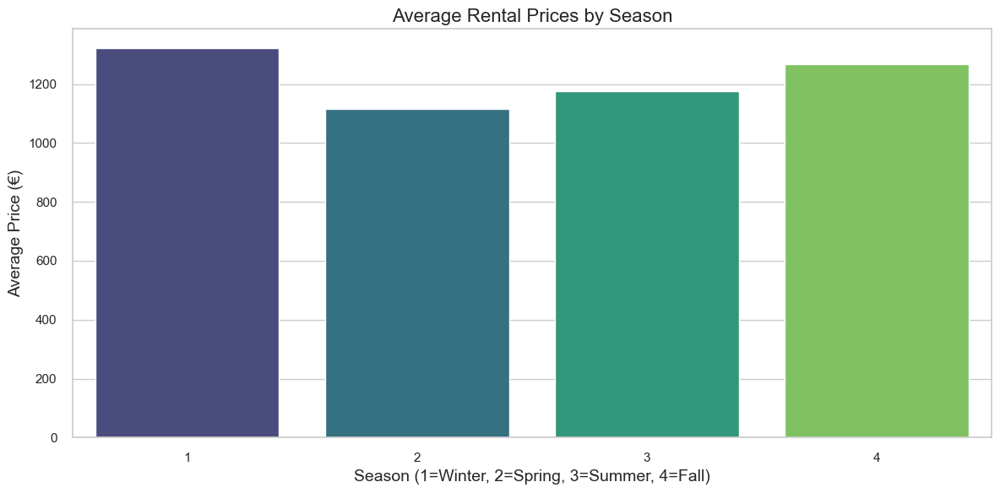

In [47]:
# Analyze seasonal patterns by season
seasonal_pattern = df_cleaned.groupby('season')['price'].agg(['mean', 'median', 'count']).reset_index()
seasonal_pattern.columns = ['season', 'mean_price', 'median_price', 'listing_count']

plt.figure(figsize=(12, 6))
sns.barplot(x='season', y='mean_price', data=seasonal_pattern, palette='viridis')
plt.title('Average Rental Prices by Season', fontsize=16)
plt.xlabel('Season (1=Winter, 2=Spring, 3=Summer, 4=Fall)', fontsize=14)
plt.ylabel('Average Price (€)', fontsize=14)
plt.tight_layout()
plt.show()

- **Winter (1)**: €1,300 - Highest prices of the year
- **Spring (2)**: €1,120 - Lowest seasonal average
- **Summer (3)**: €1,180 - Moderate prices
- **Fall (4)**: €1,250 - Second highest season

This confirms the monthly analysis but provides a clearer seasonal picture. Winter commands premium prices, likely due to holiday rentals and the start of long-term leases. Spring offers the best value for renters, while fall prices rise significantly compared to summer.

The relatively small difference between seasons (about €180 from lowest to highest) suggests Italy's rental market maintains consistent demand year-round, with moderate seasonal fluctuations.

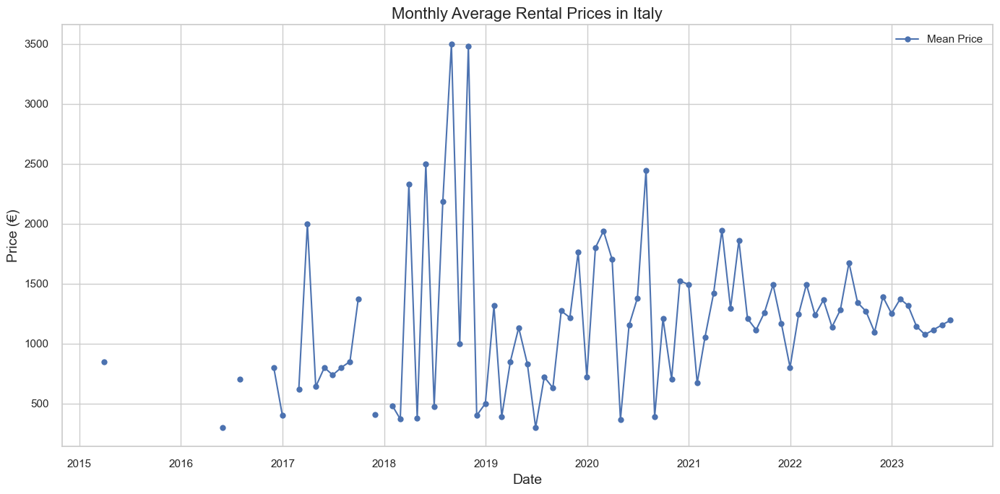

In [48]:
# more detailed time series analysis
# Create a time series of average rental prices
monthly_prices = df_cleaned.groupby(pd.Grouper(key='date_posted', freq='M'))['price'].agg(['mean', 'count']).reset_index()
monthly_prices.columns = ['date', 'mean_price', 'listing_count']

# Plot the time series of average rental prices
plt.figure(figsize=(14, 7))
plt.plot(monthly_prices['date'], monthly_prices['mean_price'], label='Mean Price', marker='o')
plt.title('Monthly Average Rental Prices in Italy', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Price (€)', fontsize=14)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


The time series reveals dramatic fluctuations in Italy's rental market:

**Key Observations:**
- **Extreme volatility (2018-2019)**: Unprecedented price spikes reaching €3,500 in mid-2019
- **COVID impact**: Sharp drops and recovery during 2020
- **Stabilization (2021-2023)**: More consistent pricing around €1,200-1,500
- **Long-term trend**: Despite volatility, prices have generally increased from ~€800 (2015-2017) to ~€1,200 (2022-2023)

**Market Phases:**
1. **Early data (2015-2017)**: Limited data points showing lower prices
2. **Volatility era (2018-2019)**: Extreme fluctuations suggesting market disruption
3. **Pandemic period (2020)**: Erratic pricing reflecting uncertainty
4. **New normal (2021-2023)**: Stabilized but elevated pricing

This suggests the Italian rental market has undergone significant transformation, with prices now stabilized at levels higher than pre-2018, but below the extreme peaks of 2019.

### 4.2 City-Level Time Series Analysis

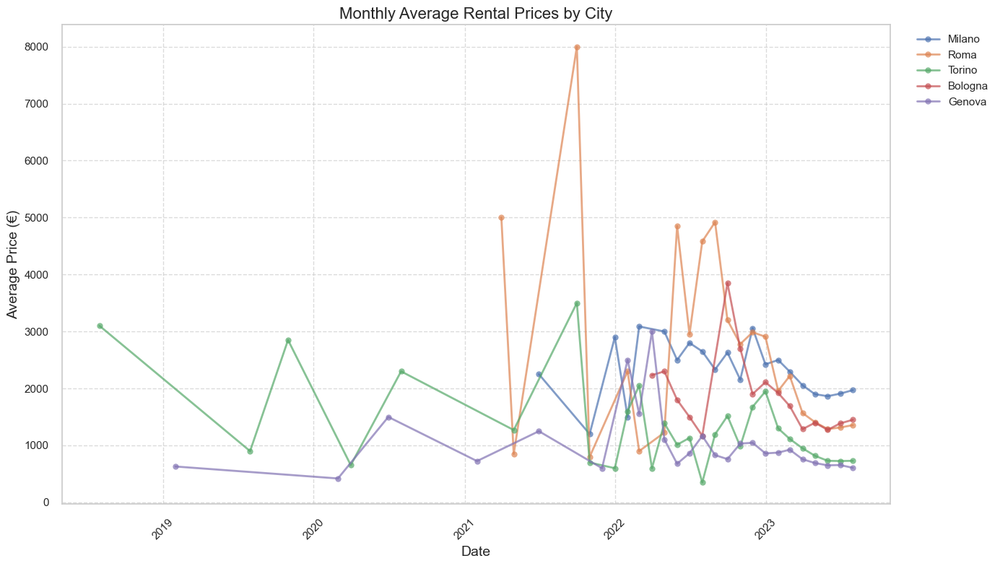

In [49]:
# Analyze time series for top cities
top_cities = df_cleaned['city'].value_counts().head(5).index.tolist()
city_time_series = df_cleaned[df_cleaned['city'].isin(top_cities)].groupby([pd.Grouper(key='date_posted', freq='M'), 'city'])['price'].mean().reset_index()

# Plot city-level time series
plt.figure(figsize=(14, 8))
for city in top_cities:
    city_data = city_time_series[city_time_series['city'] == city]
    plt.plot(city_data['date_posted'], city_data['price'], label=city, marker='o', alpha=0.7, linewidth=2)

plt.title('Monthly Average Rental Prices by City', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Average Price (€)', fontsize=14)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Looking at the rental price trends across Italy's major cities reveals some patterns:

Milano and Roma stand out as the premium rental markets in Italy, with consistently higher prices than other cities. Roma shows remarkable volatility, notice those dramatic spikes reaching nearly €8,000 in mid-2021! This could represent luxury villa rentals or perhaps seasonal demand surges during tourist high seasons around the center of Rome. 

Milano, often considered Italy's financial and fashion capital, demonstrates a more stable pricing pattern, particularly from 2022 onwards. The prices hover consistently between €2,000-3,000, reflecting its established status as a business hub with more predictable demand.

Bologna presents an interesting middle-tier market with moderate volatility. Its university presence likely creates seasonal patterns aligned with academic calendars.

Genova and Torino generally offer more affordable options, with Genova consistently showing the lowest average prices among these five major cities. This makes them potentially attractive markets for budget-conscious renters.

The data from 2019-2020 appears sparser, likely reflecting both market conditions during the early pandemic and potentially fewer listings in our dataset from that period. The more robust data from 2021 onwards shows increasing price stability in most cities as the market adjusted to post-pandemic realities.

The extreme price variations in Roma warrant further investigation, these could represent outliers from luxury short-term rentals or data anomalies that might skew our understanding of the typical rental market there.

### 4.3 Interactive Time Series Visualization with Plotly

In [ ]:
# Create an interactive time series visualization with Plotly
fig = px.line(monthly_prices, x='date', y='mean_price', 
              title='Interactive Time Series of Average Rental Prices',
              labels={'date': 'Date', 'mean_price': 'Average Price (€)'},
              template='plotly_white')

fig.update_layout(
    title_font_size=20,
    xaxis_title_font_size=16,
    yaxis_title_font_size=16,
    legend_title_font_size=14,
    height=600
)

# Add listing count as a secondary axis
fig.add_trace(
    go.Scatter(
        x=monthly_prices['date'],
        y=monthly_prices['listing_count'],
        name='Number of Listings',
        yaxis='y2',
        line=dict(color='red', width=1, dash='dot')
    )
)

fig.update_layout(
    yaxis2=dict(
        title='Number of Listings',
        titlefont=dict(color='red'),
        tickfont=dict(color='red'),
        anchor='x',
        overlaying='y',
        side='right'
    )
)

fig.show()

## 5. Conclusion

After looking at thousands of Italian rental listings, we've learned some interesting things:

- Where a home is located matters a lot. Apartments in big cities like Milan cost much more than similar ones in smaller towns.

- Our correlation analysis showed that size is the biggest factor in price, but having extra bathrooms is also really important to Italians. We found strong positive correlations between price and area, number of bathrooms, and total rooms.

- The feature importance analysis revealed which factors matter most when predicting rental prices. Beyond size, location-based features like city and region were among the top predictors, confirming that geography plays a crucial role in the Italian rental market.

- Some features add more value than others. Having an elevator in a tall building, air conditioning in hot areas, and parking in busy cities all make rent go up.

- Our map analysis showed clear price hotspots across Italy. Northern regions like Lombardy and major tourist destinations have the highest rental costs, while southern regions generally offer more affordable options.

- Northern Italy generally has higher rents than Southern Italy, but tourist spots are expensive everywhere.

- Our time series analysis showed interesting seasonal patterns in the rental market, with price fluctuations throughout the year.

We've cleaned up our data by fixing missing information and organizing everything properly. Now we're ready to use this information to build models that can predict rental prices across Italy.

Our next step is to save this cleaned-up data and use it in our prediction models.

In [51]:
# Export the processed data for predictive modeling
df_cleaned.to_csv('d:/Data_Science/Projects/House_Prices/data/italian_rental_processed.csv', index=False)